## importer les librairies

In [1]:
!pip install feature_engine
!pip install xgboost

In [2]:
# BASE
import numpy as np
import pandas as pd
import os
import calendar

# VISUALIZATION de DATA
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.ticker as ticker

# MACHINE LEARNING
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from feature_engine.encoding import OrdinalEncoder
from feature_engine.creation import CyclicalFeatures
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_squared_log_error
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import FunctionTransformer
from statsmodels.tsa.deterministic import DeterministicProcess
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.deterministic import CalendarFourier

from xgboost import XGBRegressor
from tqdm.auto import tqdm

## importer les datasets

In [3]:
# Importer les données
train=pd.read_csv("train.csv")
test=pd.read_csv("test.csv")
stores=pd.read_csv("stores.csv")
sub=pd.read_csv("sample_submission.csv")
transactions=pd.read_csv("transactions.csv").sort_values(["store_nbr", "date"])
oil=pd.read_csv("oil.csv")
holidays=pd.read_csv("holidays_events.csv")

In [4]:
# Datetime
#Convertissez la colonne "date" du jeu de données train en format datetime en utilisant la fonction to_datetime de pandas.
train["date"]=pd.to_datetime(train.date)
#Convertissez la colonne "date" du jeu de données test en format datetime.
test["date"]=pd.to_datetime(test.date)
transactions["date"]=pd.to_datetime(transactions.date)
oil["date"]=pd.to_datetime(oil.date)
holidays["date"]=pd.to_datetime(holidays.date)
# types de data
train.onpromotion=train.onpromotion.astype("float16")
train.sales=train.sales.astype("float32")
stores.cluster=stores.cluster.astype("int8")
test.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [5]:
# afficher la taille de chaque jeu de données en termes de nombre de lignes et de colonnes.
print(f'Number of data_oil samples: {oil.shape}')
print(f'Number of train_data samples: {train.shape}')
print(f'Number of test_data samples: {test.shape}')
print(f'Number of data_holi samples: {holidays.shape}')
print(f'Number of data_store samples: {stores.shape}')
print(f'Number of data_trans samples: {transactions.shape}')

Number of data_oil samples: (1218, 2)
Number of train_data samples: (3000888, 6)
Number of test_data samples: (28512, 5)
Number of data_holi samples: (350, 6)
Number of data_store samples: (54, 5)
Number of data_trans samples: (83488, 3)


## preprocessing (les fichiers différents)

### Train.csv

In [6]:
# Afficher un résumé concis du DataFrame train, notamment le type de données, le nombre non nul et la mémoire utilisée.
train.info()
# On peut voir les types de chaque colones et il y a 3000888 entiers au total.
train.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float32       
 5   onpromotion  float16       
dtypes: datetime64[ns](1), float16(1), float32(1), int64(2), object(1)
memory usage: 108.8+ MB


,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0.0
1,1,2013-01-01,1,BABY CARE,0.0,0.0
2,2,2013-01-01,1,BEAUTY,0.0,0.0
3,3,2013-01-01,1,BEVERAGES,0.0,0.0
4,4,2013-01-01,1,BOOKS,0.0,0.0


In [7]:
# pour vérifier s'il y a des valeurs manquantes
train.isna().sum()
# le résultat montre qu'il n'y a pas de NA

id             0
date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64

In [8]:
# convertir le type de données de la colonne family en category
train['family']=train['family'].astype('category')
#Créer une nouvelle colonne family_category qui contient des codes numériques pour chaque catégorie de la colonne family.
train['family_category']=train['family'].cat.codes
# Créer un dictionnaire qui mappe les codes numériques à leurs catégories originales de la colonne family.
family_category=dict( zip( train['family'].cat.codes,train['family'] ) )
family_category
# On peut voir qu'il y a 33 categorie

{0: 'AUTOMOTIVE',
 1: 'BABY CARE',
 2: 'BEAUTY',
 3: 'BEVERAGES',
 4: 'BOOKS',
 5: 'BREAD/BAKERY',
 6: 'CELEBRATION',
 7: 'CLEANING',
 8: 'DAIRY',
 9: 'DELI',
 10: 'EGGS',
 11: 'FROZEN FOODS',
 12: 'GROCERY I',
 13: 'GROCERY II',
 14: 'HARDWARE',
 15: 'HOME AND KITCHEN I',
 16: 'HOME AND KITCHEN II',
 17: 'HOME APPLIANCES',
 18: 'HOME CARE',
 19: 'LADIESWEAR',
 20: 'LAWN AND GARDEN',
 21: 'LINGERIE',
 22: 'LIQUOR,WINE,BEER',
 23: 'MAGAZINES',
 24: 'MEATS',
 25: 'PERSONAL CARE',
 26: 'PET SUPPLIES',
 27: 'PLAYERS AND ELECTRONICS',
 28: 'POULTRY',
 29: 'PREPARED FOODS',
 30: 'PRODUCE',
 31: 'SCHOOL AND OFFICE SUPPLIES',
 32: 'SEAFOOD'}

In [9]:
train['date']=pd.to_datetime(train['date'])
train['day_of_week']=train['date'].dt.dayofweek
train['month']=train['date'].dt.month
train['year']=train['date'].dt.year
train.head()

,id,date,store_nbr,family,sales,onpromotion,family_category,day_of_week,month,year
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0.0,0,1,1,2013
1,1,2013-01-01,1,BABY CARE,0.0,0.0,1,1,1,2013
2,2,2013-01-01,1,BEAUTY,0.0,0.0,2,1,1,2013
3,3,2013-01-01,1,BEVERAGES,0.0,0.0,3,1,1,2013
4,4,2013-01-01,1,BOOKS,0.0,0.0,4,1,1,2013


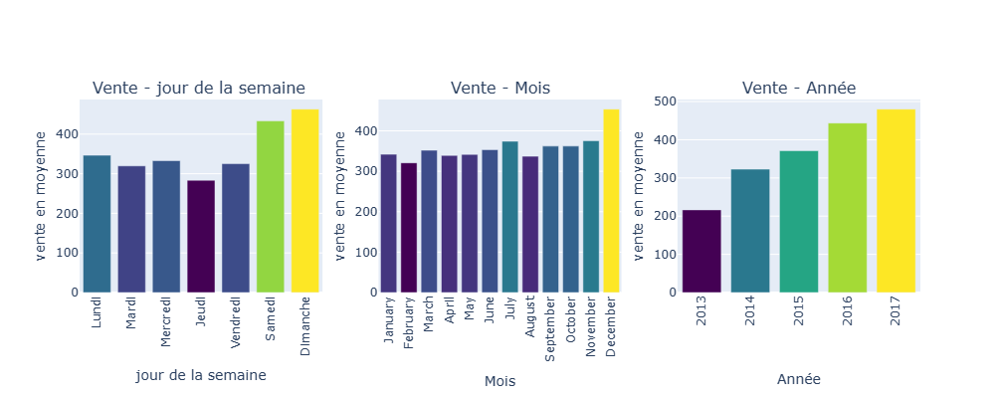

In [10]:
#Ces trois lignes regroupent les données par day_of_week (jour de la semaine), month (mois) et year (année), puis calculent la moyenne des ventes pour chaque groupe.
data_grouped_day=train.groupby(['day_of_week']).mean()['sales']
data_grouped_month=train.groupby(['month']).mean()['sales']
data_grouped_year=train.groupby(['year']).mean()['sales']

fig=make_subplots(rows=1,cols=3,subplot_titles=('Vente - jour de la semaine ','Vente - Mois','Vente - Année'))

#Sous-graphique du jour de la semaine
day_names=['Lundi','Mardi','Mercredi','Jeudi','Vendredi','Samedi','Dimanche']
fig.add_trace(go.Bar(x=day_names,y=data_grouped_day,marker=dict(color=data_grouped_day,colorscale='Viridis')),row=1,col=1)
fig.update_xaxes(title_text='jour de la semaine',row=1,col=1,tickangle=-90)
fig.update_yaxes(title_text='vente en moyenne',row=1,col=1,title_standoff=1)

# Sous-graphique du mois
month_names=[calendar.month_name[i] for i in range(1, 13)]
fig.add_trace(go.Bar(x=month_names,y=data_grouped_month,marker=dict(color=data_grouped_month,colorscale='Viridis')),row=1,col=2)
fig.update_xaxes(title_text='Mois',row=1,col=2,tickangle=-90)
fig.update_yaxes(title_text='vente en moyenne',row=1,col=2,title_standoff=1)

# sous-graphique de l'année
fig.add_trace(go.Bar(x=data_grouped_year.index,y=data_grouped_year,marker=dict(color=data_grouped_year,colorscale='Viridis')),row=1,col=3)
fig.update_xaxes(title_text='Année',row=1,col=3,tickangle=-90,title_standoff=48,tickvals=data_grouped_year.index,ticktext=data_grouped_year.index)
fig.update_yaxes(title_text='vente en moyenne',row=1,col=3,title_standoff=1)

# Mise à jour de la mise en page du graphique
fig.update_layout(height=400,width=1000,showlegend=False)

# Affichage du graphique
fig.show()

In [11]:
### Most sales in week - Saturday and Sunday
### Most sales in month - December
### sales in year - Increasing yearly

### transaction.csv

In [12]:
transactions.head()

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520


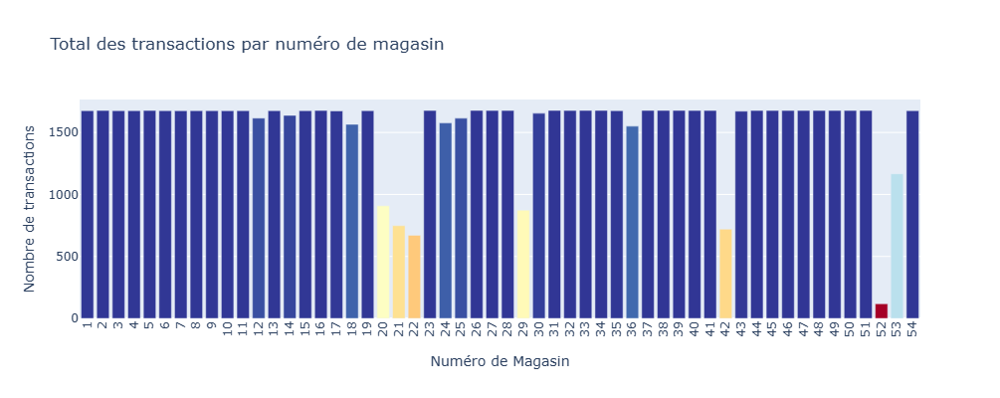

In [13]:
store_counts=transactions['store_nbr'].value_counts().sort_index()
fig=go.Figure()
bars=fig.add_trace(go.Bar(x=store_counts.index, y=store_counts.values,marker_color=store_counts.values,marker_colorscale='RdYlBu'))
fig.update_layout(title_text="Total des transactions par numéro de magasin", xaxis_title="Numéro de Magasin",yaxis_title="Nombre de transactions")
fig.update_xaxes(tickangle=-90,title_standoff=20,tickvals=store_counts.index,ticktext=store_counts.index)
fig.update_yaxes(title_standoff=5)
# ajustement de la mise en page
fig.update_layout(height=400,width=1000,showlegend=False)
# Show the plot
fig.show()

In [14]:
transactions.isna().sum()

date            0
store_nbr       0
transactions    0
dtype: int64

In [15]:
transactions['date']=pd.to_datetime(transactions['date'])
transactions['day_of_week']=transactions['date'].dt.dayofweek
transactions['month']=transactions['date'].dt.month
transactions['year']=transactions['date'].dt.year
transactions.head()

,date,store_nbr,transactions,day_of_week,month,year
1,2013-01-02,1,2111,2,1,2013
47,2013-01-03,1,1833,3,1,2013
93,2013-01-04,1,1863,4,1,2013
139,2013-01-05,1,1509,5,1,2013
185,2013-01-06,1,520,6,1,2013


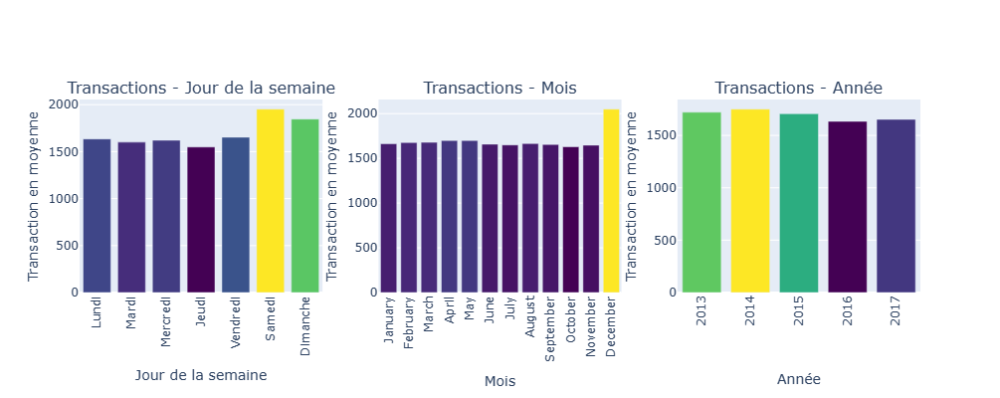

In [16]:
data_grouped_day=transactions.groupby(['day_of_week']).mean()['transactions']
data_grouped_month=transactions.groupby(['month']).mean()['transactions']
data_grouped_year=transactions.groupby(['year']).mean()['transactions']

fig=make_subplots(rows=1,cols=3,subplot_titles=('Transactions - Jour de la semaine','Transactions - Mois','Transactions - Année'))

# Day of Week subplot
day_names=['Lundi','Mardi','Mercredi','Jeudi','Vendredi', 'Samedi', 'Dimanche']
fig.add_trace(go.Bar(x=day_names,y=data_grouped_day,marker=dict(color=data_grouped_day,colorscale='Viridis')),row=1,col=1)
fig.update_xaxes(title_text='Jour de la semaine',row=1,col=1,tickangle=-90)
fig.update_yaxes(title_text='Transaction en moyenne',row=1,col=1,title_standoff=1)

# Month subplot
month_names=[calendar.month_name[i] for i in range(1, 13)]
fig.add_trace(go.Bar(x=month_names,y=data_grouped_month,marker=dict(color=data_grouped_month,colorscale='Viridis')),row=1,col=2)
fig.update_xaxes(title_text='Mois',row=1,col=2,tickangle=-90)
fig.update_yaxes(title_text='Transaction en moyenne',row=1, col=2,title_standoff=1)

# Year subplot
fig.add_trace(go.Bar(x=data_grouped_year.index,y=data_grouped_year,marker=dict(color=data_grouped_year,colorscale='Viridis')),row=1,col=3)
fig.update_xaxes(title_text='Année',row=1,col=3,tickangle=-90,title_standoff=48,tickvals=data_grouped_year.index,ticktext=data_grouped_year.index)
fig.update_yaxes(title_text='Transaction en moyenne',row=1,col=3,title_standoff=1)

# Update subplot layout
fig.update_layout(height=400,width=1000,showlegend=False)

# Show the plot
fig.show()

In [17]:
### Most transactions in week - Saturday and Sunday
### Most transactions in month - December
### Transactions in year - Remaining almost at same level

### oil prices.csv

In [18]:
oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [19]:
oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        1218 non-null   datetime64[ns]
 1   dcoilwtico  1175 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 19.2 KB


In [20]:
oil.isna().sum()

date           0
dcoilwtico    43
dtype: int64

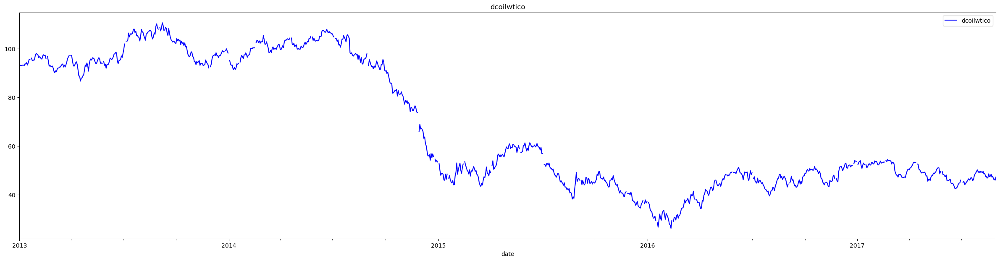

In [21]:
fig,axes=plt.subplots(nrows=1,ncols=1,figsize=(30,7))
oil.plot.line(x="date",y="dcoilwtico",color='b',title ="dcoilwtico",ax = axes)
plt.show()

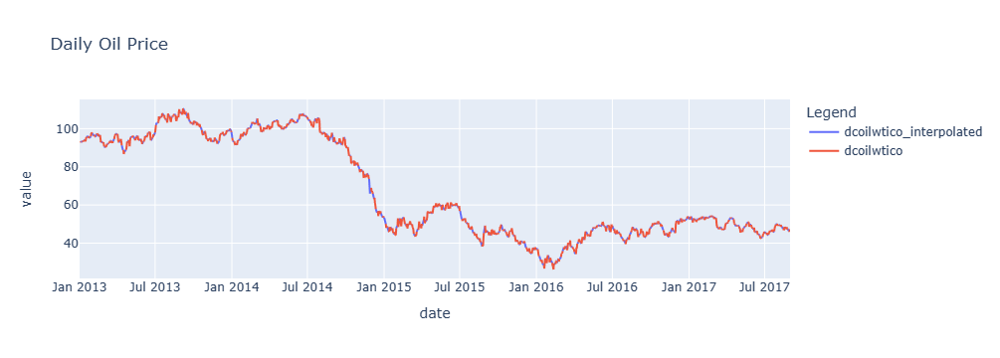

In [61]:
# Resample
oil=oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
oil["dcoilwtico"]=np.where(oil["dcoilwtico"]==0,np.nan,oil["dcoilwtico"])
oil["dcoilwtico_interpolated"]=oil.dcoilwtico.interpolate()
# Plot
p=oil.melt(id_vars=['date']+list(oil.keys()[5:]),var_name='Legend')
px.line(p.sort_values(["Legend", "date"],ascending=[False, True]),x='date',y='value',color='Legend',title = "Daily Oil Price" )

Comme vous pouvez le voir ci-dessous, certains points de données manquent dans les données quotidiennes sur le pétrole. 
Cependant, j'ai choisi une solution simple. L'interpolation linéaire est adaptée à cette série temporelle. 
Vous pouvez voir la tendance et prévoir les points de données manquants, lorsque vous regardez un graphique de série 
temporelle du prix du pétrole.Pour La colonne date est définie comme index, puis la colonne dcoilwtico
(représentant le prix du pétrole) est rééchantillonnée au quotidien, en sommant les valeurs pour les dates manquantes.
Cette étape assure que l'ensemble de données contient des enregistrements pour chaque jour consécutif.

Les prix du pétrole ont été les plus élevés au cours de la seconde moitié de 2013, 
mais ils ont commencé à diminuer à partir de 2014 et ont atteint leur valeur la plus 
basse en 2016. Il a continué à augmenter pour se maintenir dans une fourchette de 
prix comprise entre 40 et 60 dollars.

In [23]:
# trouver les corrélation entre le prix du pétrole et les ventes, entre le prix du pétrole et les transactions
temp=pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(),transactions,how="left")
temp=pd.merge(temp,oil,how="left")
print("Correlation with Daily Oil Prices")
print(temp.drop(["store_nbr","dcoilwtico"],axis=1).corr("spearman").dcoilwtico_interpolated.loc[["sales","transactions"]],"\n")

Correlation with Daily Oil Prices
sales          -0.303237
transactions    0.040105
Name: dcoilwtico_interpolated, dtype: float64 



D'après le résultat, Logiquement, si le prix quotidien du pétrole est élevé, nous nous attendons à ce que l'économie de l'Équateur soit mauvaise, ce qui signifie que le prix des produits augmente et que les ventes diminuent. Il y a donc une relation négative.Cependant,La corrélation entre le pétrole et les ventes et transactions suggère que le statut économique du pays et la consommation quotidienne de produits d'épicerie n'ont pas de relation particulière.Vérifions les articles les plus vendus et la promotion pour voir quels articles influencent le plus les ventes totales.

### store.csv

In [24]:
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [25]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int8  
dtypes: int64(1), int8(1), object(3)
memory usage: 1.9+ KB


In [26]:
stores.isna().sum()
# il n'y a pas de valeurs manquantes

store_nbr    0
city         0
state        0
type         0
cluster      0
dtype: int64

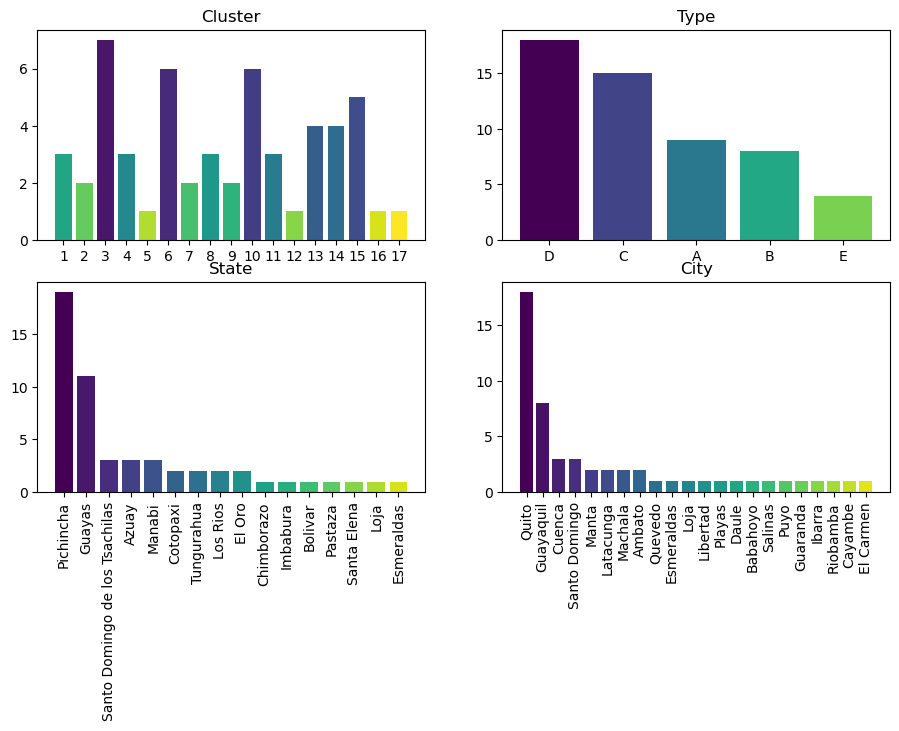

In [27]:
#visualisation les qutres colones de 'stores'
fig,axs=plt.subplots(2,2,figsize=(11,6))

clusters=np.arange(1,len(stores['cluster'].unique())+1)

axs[0,0].bar(stores['cluster'].value_counts().index,stores['cluster'].value_counts(),color=plt.cm.viridis(clusters/len(clusters)))
axs[0,0].set_title('Cluster')
axs[0,0].set_xticks(clusters)

axs[0,1].bar(stores['type'].value_counts().index, stores['type'].value_counts(), color=plt.cm.viridis(np.arange(len(stores['type'].value_counts().index))/len(stores['type'].value_counts().index)))
axs[0,1].set_title('Type')

axs[1,0].bar(stores['state'].value_counts().index, stores['state'].value_counts(), color=plt.cm.viridis(np.arange(len(stores['state'].value_counts().index))/len(stores['state'].value_counts().index)))
axs[1,0].set_title('State')
axs[1,0].set_xticks(np.arange(len(stores['state'].value_counts().index)))
axs[1,0].set_xticklabels(stores['state'].value_counts().index,rotation=90)

axs[1,1].bar(stores['city'].value_counts().index,stores['city'].value_counts(),color=plt.cm.viridis(np.arange(len(stores['city'].value_counts().index))/len(stores['city'].value_counts().index)))
axs[1,1].set_title('City')
axs[1,1].set_xticks(np.arange(len(stores['city'].value_counts().index)))
axs[1,1].set_xticklabels(stores['city'].value_counts().index,rotation=90)

plt.show()

### holidays.csv

In [28]:
holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [29]:
holidays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         350 non-null    datetime64[ns]
 1   type         350 non-null    object        
 2   locale       350 non-null    object        
 3   locale_name  350 non-null    object        
 4   description  350 non-null    object        
 5   transferred  350 non-null    bool          
dtypes: bool(1), datetime64[ns](1), object(4)
memory usage: 14.1+ KB


In [30]:
holidays.isna().sum()

date           0
type           0
locale         0
locale_name    0
description    0
transferred    0
dtype: int64

In [31]:
holidays['type'].value_counts()

Holiday       221
Event          56
Additional     51
Transfer       12
Bridge          5
Work Day        5
Name: type, dtype: int64

Ventes moyennes pendant les vacances est 425.4221496582031


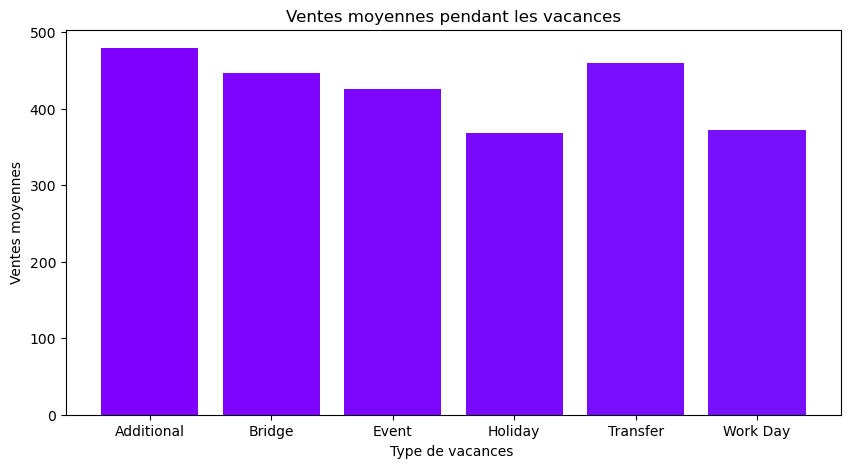

In [32]:
day_type=holidays[['date','type']]
avg_sales=train.groupby('date').agg({'sales':'mean'}).reset_index()
df=pd.merge_asof(day_type,avg_sales,on='date')
df.dropna(inplace=True)
df.reset_index(drop=True,inplace=True)
df_1=df.groupby(['type']).mean()['sales']
average_holiday_sales=df_1.mean()

print(f'Ventes moyennes pendant les vacances est {average_holiday_sales}')

fig,ax=plt.subplots(figsize=(10,5))
bars=ax.bar(df_1.index,df_1,color=plt.cm.rainbow(np.arange(len(df_1))))

ax.set_title('Ventes moyennes pendant les vacances')
ax.set_xlabel('Type de vacances ')
ax.set_ylabel('Ventes moyennes')

plt.show()

## Features

### Trend

In [33]:
# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure",autolayout=True,figsize=(11,5))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
plot_params=dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format='retina'
# télécharger le dataset du vente
avg_sales=train.groupby('date').agg({'sales':'mean'}).reset_index()
#avg_sales = avg_sales.set_index('date')
#avg_sales.index = pd.to_datetime(avg_sales.index)
avg_sales=avg_sales.set_index('date').to_period("D")
avg_sales.head()

,sales
date,
2013-01-01,1.409438
2013-01-02,278.390808
2013-01-03,202.840195
2013-01-04,198.911148
2013-01-05,267.873230


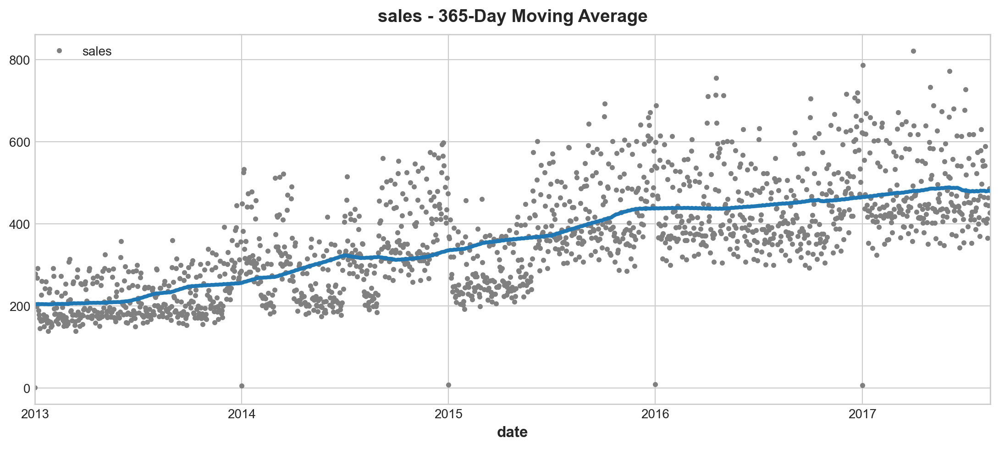

In [34]:
# D'après le cours de série temporelle de kaggle, on peut construire un MA par le méthode rolling
moving_average=avg_sales.rolling(
    window=365,       # Fenêtre de 365 jours
    center=True,      # place la moyenne au centre de la fenêtre
    min_periods=183,  # choisir environ la moitié de la taille de la fenêtre
).mean()              # calculer la moyenne (on pourrait aussi faire médiane, std, min, max, ...)
ax=avg_sales.plot(style=".",color="0.5")
moving_average.plot(ax=ax,linewidth=3,title="sales - 365-Day Moving Average",legend=False);

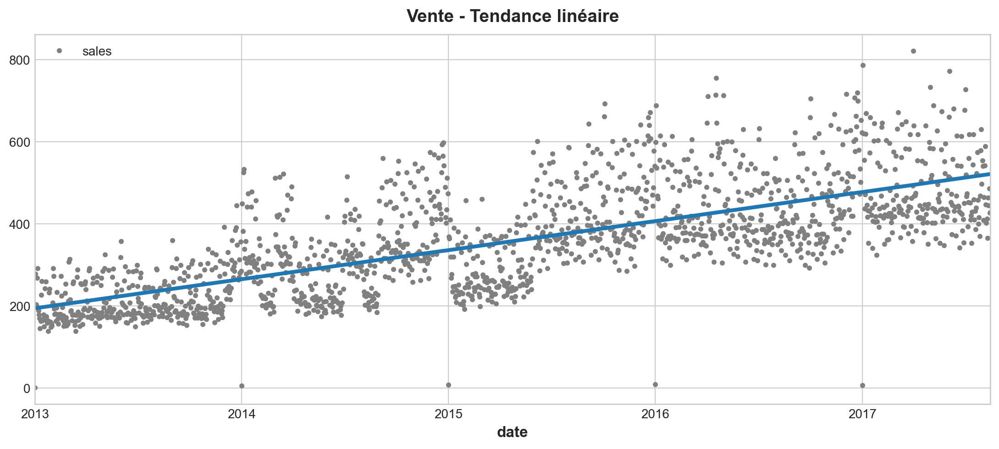

In [35]:
# Pour créer le caractère de la tendance
dp=DeterministicProcess(
    index=avg_sales.index,  # dates des données d'entraînement
    constant=True,       #caractéristique fictive pour le biais (ordonnée à l'origine)
    order=1,             #  the time dummy (trend)
    drop=True,           # supprimer des termes si nécessaire pour éviter la colinéarité
)
#`in_sample` crée des caractéristiques pour les dates données dans l'argument `index`
X=dp.in_sample()
y=avg_sales["sales"]  # l'objectif
# L'interception est la même que la fonction `const` de DeterministicProcess. LinearRegression se comporte mal avec les caractéristiques nous devons donc nous assurer de l'exclure ici.
model=LinearRegression(fit_intercept=False)
model.fit(X,y)
y_pred=pd.Series(model.predict(X), index=X.index)
ax=avg_sales.plot(style=".",color="0.5",title="Vente - Tendance linéaire")
_=y_pred.plot(ax=ax,linewidth=3,label="Tendance")
# Series avec une tendance linéaire

In [36]:
# Selon le caractéristique de la tendance, on peut prédire les ventes apr
X=dp.out_of_sample(steps=180)
y_fore=pd.Series(model.predict(X),index=X.index)
y_fore.head()

2017-08-16    521.513055
2017-08-17    521.707402
2017-08-18    521.901749
2017-08-19    522.096096
2017-08-20    522.290443
Freq: D, dtype: float64

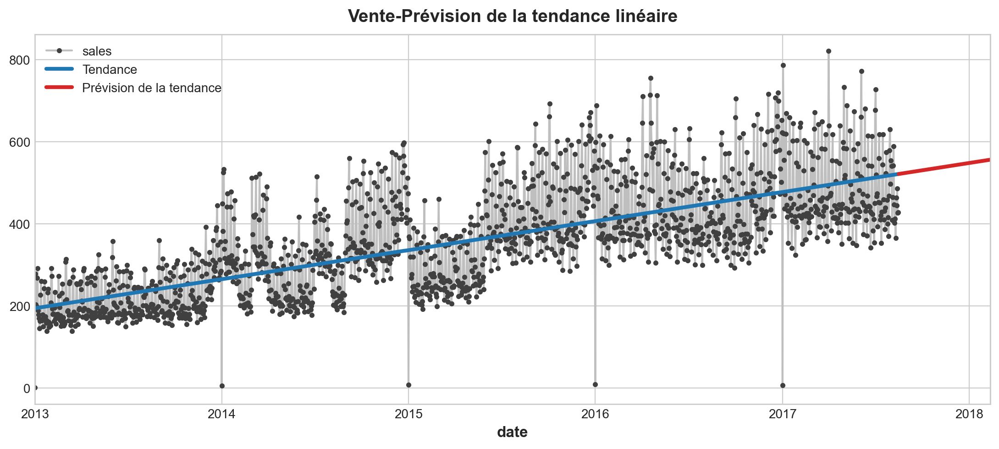

In [37]:
ax=avg_sales["2013-01":].plot(title="Vente-Prévision de la tendance linéaire",**plot_params)
ax=y_pred["2013-01":].plot(ax=ax,linewidth=3,label="Tendance")
ax=y_fore.plot(ax=ax,linewidth=3,label="Prévision de la tendance",color="C3")
_=ax.legend()

### Saisonnalité

In [38]:
def seasonal_plot(X,y,period,freq,ax=None):
    if ax is None:
        _,ax=plt.subplots()
    palette=sns.color_palette("husl",n_colors=X[period].nunique(),)
    ax=sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot({period}/{freq})")
    for line,name in zip(ax.lines, X[period].unique()):
        y_=line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1,y_),
            xytext=(6,0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax
def plot_periodogram(ts,detrend='linear',ax=None):
    from scipy.signal import periodogram
    fs=pd.Timedelta("1Y")/pd.Timedelta("1D")
    freqencies,spectrum=periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _,ax=plt.subplots()
    ax.step(freqencies,spectrum,color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1,2,4,6,12,26,52,104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y",style="sci",scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

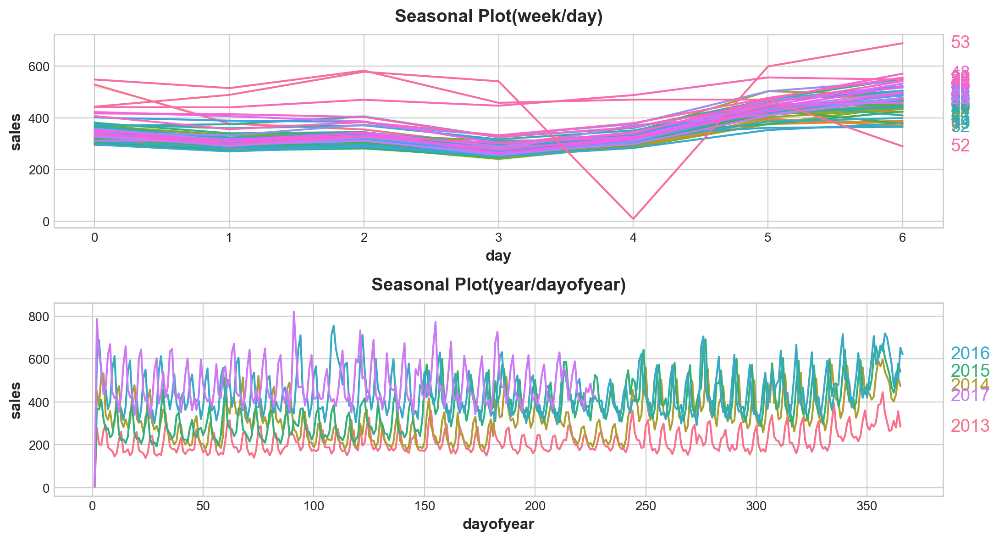

In [39]:
X=avg_sales.copy()
# Nombre de jours dans la semaine
X['day']=X.index.dayofweek # l'axe des x (freq)
X['week']=X.index.week # la période saisonnière (période)
# Nombre de jours dans l'année
X['dayofyear']=X.index.dayofyear
X['year']=X.index.year
fig,(ax0,ax1)=plt.subplots(2,1,figsize=(11, 6))
seasonal_plot(X,y="sales",period="week",freq="day",ax=ax0)
seasonal_plot(X,y="sales",period="year",freq="dayofyear",ax=ax1);

C:\Users\79451\AppData\Local\Temp\ipykernel_23064\3034280395.py:4: FutureWarning:

Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version.

C:\Users\79451\AppData\Local\Temp\ipykernel_23064\3034280395.py:6: FutureWarning:

Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version.



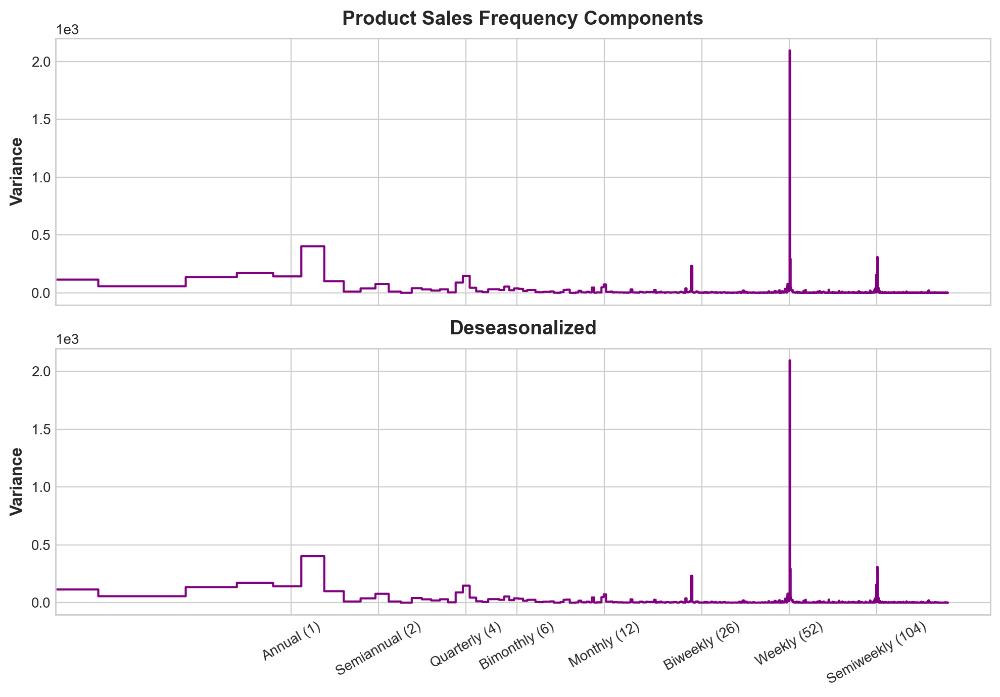

In [40]:
#plot_periodogram(avg_sales.sales);
y_deseason=y-y_pred
fig,(ax1,ax2) = plt.subplots(2,1,sharex=True,sharey=True,figsize=(10,7))
ax1=plot_periodogram(y,ax=ax1)
ax1.set_title("Product Sales Frequency Components")
ax2=plot_periodogram(y_deseason,ax=ax2);
ax2.set_title("Deseasonalized");

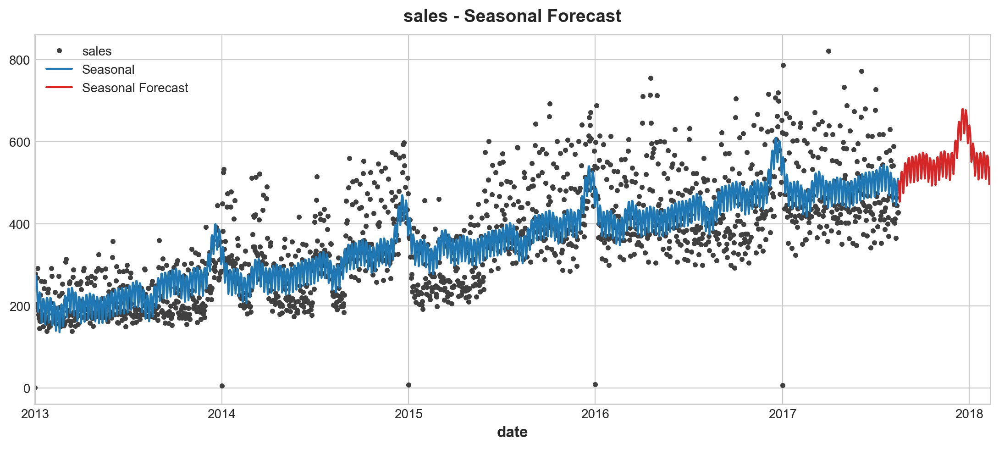

In [41]:
fourier=CalendarFourier(freq="A",order=10)  # 10 paires sin/cos pour la saisonnalité annuelle
dp=DeterministicProcess(
    index=avg_sales.index,
    constant=True,   # Caractéristique fictive pour le biais (ordonnée à l'origine)
    order=1,         # tendance ( ordre 1 signifie linéaire)
    seasonal=True,   # Saisonnalité hebdomadaire (indicateurs)
    additional_terms=[fourier], # saisonnalité annuelle
    drop=True,       # supprimer les termes pour éviter la colinéarité
)
X=dp.in_sample() # créer des caractéristiques pour les dates dans tunnel.index
y=avg_sales["sales"]
model=LinearRegression(fit_intercept=False)
_=model.fit(X,y)
y_pred=pd.Series(model.predict(X),index=y.index)
X_fore=dp.out_of_sample(steps=180)
y_fore=pd.Series(model.predict(X_fore),index=X_fore.index)
ax=y.plot(color='0.25',style='.',title="sales - Seasonal Forecast")
ax=y_pred.plot(ax=ax,label="Seasonal")
ax=y_fore.plot(ax=ax,label="Seasonal Forecast",color='C3')
_=ax.legend()

## Influence de tremblemeng de terre

In [42]:
train['year_month']=train['date'].dt.to_period('M').astype(str)
# regrouper par année-mois et calculer les ventes moyennes
avg_sales=train.groupby('year_month')['sales'].mean()
avg_sales.index=pd.to_datetime(avg_sales.index)

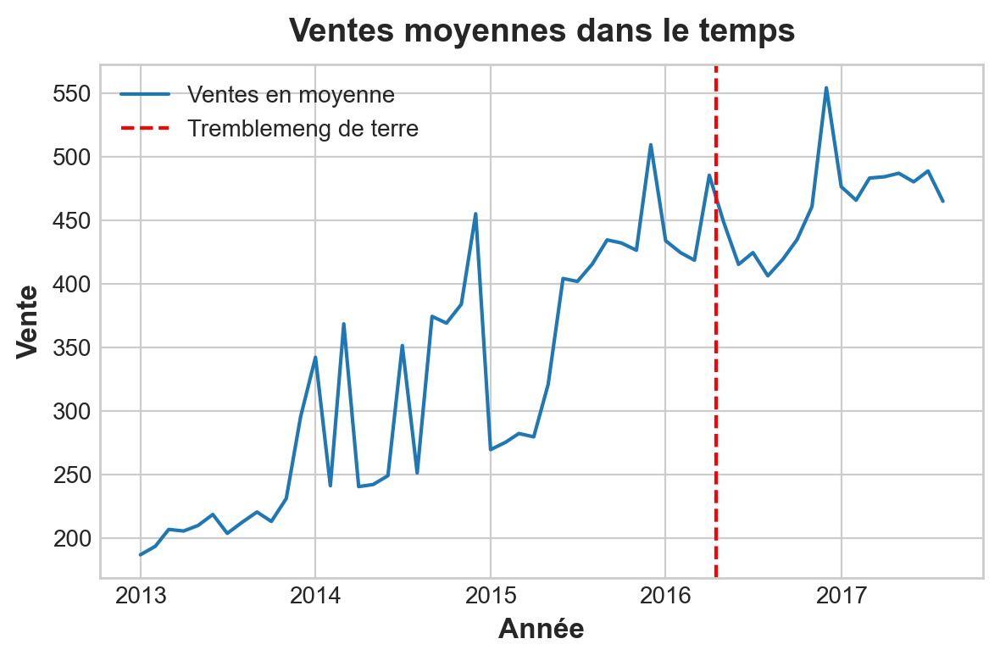

In [43]:
fig,ax=plt.subplots(figsize=(6,4))
ax.plot(avg_sales.index,avg_sales.values,label='Ventes en moyenne')
ax.set_xlabel('Année')
ax.set_ylabel('Vente')
ax.set_title('Ventes moyennes dans le temps')
# ajouter une ligne verticale pour le tremblement de terre d'avril 2016
ax.axvline(pd.to_datetime('2016-04-16'),color='r',linestyle='--',label='Tremblemeng de terre')
ax.legend()
plt.show()

## Prédiction

In [44]:
# Créer des colonnes distinctes pour l'année, le mois, le jour et la semaine
train['week']=train['date'].dt.isocalendar().week
train['day']=train['date'].dt.day
test['year']=test['date'].dt.year
test['month']=test['date'].dt.month
test['day']=test['date'].dt.day
test['week']=test['date'].dt.isocalendar().week
train=train.drop(['day_of_week','year_month','family_category'],axis=1)
train.head()

,id,date,store_nbr,family,sales,onpromotion,month,year,week,day
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0.0,1,2013,1,1
1,1,2013-01-01,1,BABY CARE,0.0,0.0,1,2013,1,1
2,2,2013-01-01,1,BEAUTY,0.0,0.0,1,2013,1,1
3,3,2013-01-01,1,BEVERAGES,0.0,0.0,1,2013,1,1
4,4,2013-01-01,1,BOOKS,0.0,0.0,1,2013,1,1


In [45]:
train['week']=train['week'].astype('int')
test['week']=test['week'].astype('int')

In [46]:
#Les données antérieures à cette date seront considérées comme des données de formation. Les données à partir de cette date seront considérées comme test. 
#L'ensemble de test contient les données des 30 prochains jours (de "2017-07-15" à "2017-08-15").
X_train,X_val,y_train,y_val=train_test_split(train.drop(['id','date','sales'],axis=1),train['sales'],test_size=0.3)

In [47]:
#créer pipeline
cat_variables=['family']
time_variables=['day','month','year','week']
#Encoder les colonnes catégorielles avec des nombres.
ord_encoder=OrdinalEncoder(encoding_method='arbitrary',variables=cat_variables)
cf_encoder=CyclicalFeatures(variables=time_variables)
#créer encoder pipeline
encoders=make_pipeline((ord_encoder),(cf_encoder))
xgb_params={'n_estimators':100,'max_depth':6,'eta':0.1,'gamma':2,'n_jobs':-1,'random_state':42,'eval_metric':'rmse'}
#Nous utiliserons le régresseur XGBoost pour prédire les ventes de chaque produit de chaque magasin.
#Au total, nous devrons prédire les ventes quotidiennes individuelles de 1782 produits pour les 30 prochains jours.
#33 produits de 54 magasins = 1782 produits au total
#XGBoost
xgb=XGBRegressor(**xgb_params)

In [48]:
# mettre tous les pipelines ensemble
pipeline=make_pipeline(
    (encoders), #Encoders
    (xgb) #XGBoost
)
print("Pipeline Created!")

Pipeline Created!


In [49]:
transformer=TransformedTargetRegressor(regressor=pipeline,func=np.log1p,inverse_func=lambda x:np.exp(x)-1,check_inverse=False)

In [50]:
# Former le modèle en utilisant la validation croisée des séries temporelles 5 fois. La métrique RMSE sera utilisée.
tscv=TimeSeriesSplit(n_splits=5,gap=7*54*33)
rmse_values=[]
rmsle_values=[]
cv=1
#Passer la boucle dans les plis
print("Cross Validating.....")
for train_index, test_index in tscv.split(X_train, y_train):   
    X_train_cv, X_test_cv=X_train.iloc[train_index],X_train.iloc[test_index]
    y_train_cv, y_test_cv=y_train.iloc[train_index],y_train.iloc[test_index]
    # Ajuster le modèle sur les données d'entraînement
    transformer.fit(X_train_cv,y_train_cv)
    # Prédire sur les données de test
    y_pred=transformer.predict(X_test_cv)
    # Calculer l'erreur quadratique moyenne
    rmse=mean_squared_error(y_test_cv,y_pred,squared=False)
    rmsle=mean_squared_log_error(y_test_cv,y_pred.clip(0.0),squared=False)
    print(f"cv #{cv}:RMSE={rmse:.3f}|RMSLE={rmsle:.3f}")
    rmse_values.append(rmse)
    rmsle_values.append(rmsle)
    cv+=1

print(f"Average RMSE:{np.mean(rmse_values):.3f}|Average RMSLE:{np.mean(rmsle_values):.3f}")

Cross Validating.....
cv #1:RMSE=586.439|RMSLE=0.923
cv #2:RMSE=600.167|RMSLE=0.923
cv #3:RMSE=580.118|RMSLE=0.918
cv #4:RMSE=595.401|RMSLE=0.913
cv #5:RMSE=584.778|RMSLE=0.937
Average RMSE:589.380|Average RMSLE:0.923


In [51]:
predictions=transformer.predict(X_val)
val_rmse=mean_squared_error(y_val,predictions,squared=False)
val_rmsle=mean_squared_log_error(y_val,predictions.clip(0.0),squared=False)
print(f"Test RMSE Score: {val_rmse:.3f}|Test RMSLE Score:{val_rmsle:.3f}")

Test RMSE Score: 577.283|Test RMSLE Score:0.937


In [52]:
val_df=pd.concat([X_val[['store_nbr','family']],y_val],axis=1)
val_df['predictions']=predictions
cut_off_date="2017-06-15"
val_df['date']=train.loc[train['date'].ge(cut_off_date),'date']
val_df['error']=val_df['sales']-val_df['predictions']

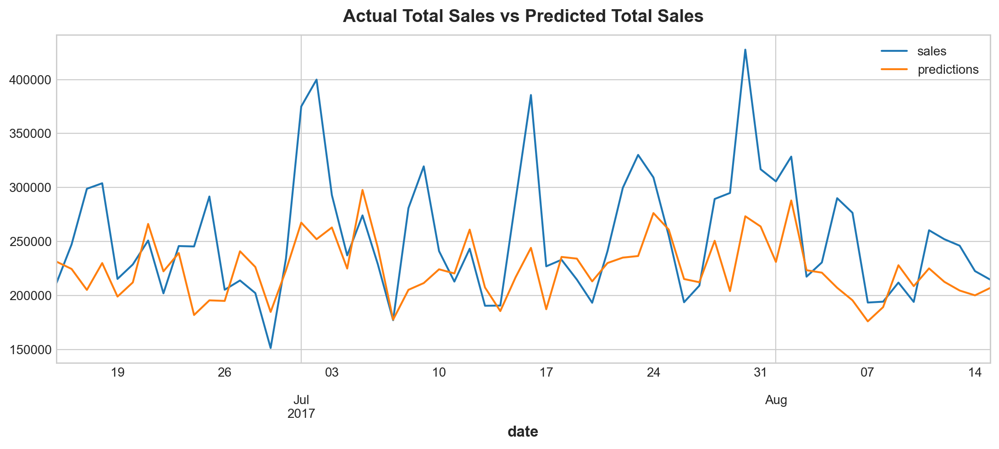

In [53]:
val_df.groupby('date')[['sales','predictions']].sum().plot(title='Actual Total Sales vs Predicted Total Sales');

In [54]:
family_agg_val_df=val_df.groupby(['date','family'],as_index=False)[['sales','predictions']].sum()
fig,axes=plt.subplots(17, 2, tight_layout=True, figsize=(30, 50), squeeze = False)
for prd,ax in zip(family_agg_val_df['family'].unique(),axes.flatten()):
    family_agg_val_df.query(f"family=='{prd}'").plot(x='date',y=['sales','predictions'],ax=ax)
    ax.set_title(prd)
    ax.set_xlabel("");
axes[-1,-1].set_axis_off()

In [55]:
new_df=pd.DataFrame({"date":test["date"]})
X_test=test.drop(['id','date'], axis=1)
X_test.head()

,store_nbr,family,onpromotion,year,month,day,week
0,1,AUTOMOTIVE,0,2017,8,16,33
1,1,BABY CARE,0,2017,8,16,33
2,1,BEAUTY,2,2017,8,16,33
3,1,BEVERAGES,20,2017,8,16,33
4,1,BOOKS,0,2017,8,16,33


In [56]:
X_test=X_test.reindex(columns=['store_nbr','family','onpromotion','month','year','week','day'])
predictions=transformer.predict(X_test)
test_df=pd.DataFrame({
    "store_nbr":X_test["store_nbr"],
    "family":X_test["family"]
})
test_df['predictions']=predictions
cut_off_date="2017-06-15"
test_df['date']=new_df
test_df.head()

,store_nbr,family,predictions,date
0,1,AUTOMOTIVE,3.789331,2017-08-16
1,1,BABY CARE,0.219165,2017-08-16
2,1,BEAUTY,4.144987,2017-08-16
3,1,BEVERAGES,2397.403076,2017-08-16
4,1,BOOKS,0.126062,2017-08-16


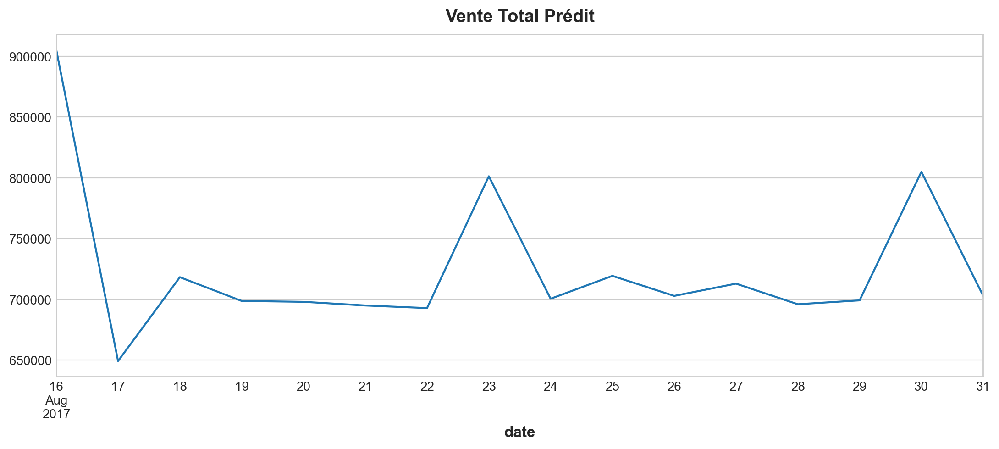

In [57]:
test_df.groupby('date')['predictions'].sum().plot(title='Vente Total Prédit');

In [58]:
family_agg_test_df=test_df.groupby(['date','family'],as_index=False)['predictions'].sum()

fig,axes=plt.subplots(17,2,tight_layout=True,figsize=(30, 60),squeeze = False)

for prd,ax in zip(family_agg_test_df['family'].unique(),axes.flatten()):
    family_agg_test_df.query(f"family=='{prd}'").plot(x='date',y='predictions',ax=ax)
    ax.set_title(prd)
    ax.set_xlabel("");
axes[-1,-1].set_axis_off()